# GoingDeeper 1 ResNet Ablation Study

## 코드

In [1]:
import tensorflow as tf
from tensorflow import keras

# Helper libraries
import numpy as np
import matplotlib.pyplot as plt

import tensorflow_datasets as tfds

In [2]:
# Tensorflow가 활용할 GPU가 장착되어 있는지 확인해 봅니다.
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [3]:
(ds_train, ds_test), ds_info = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]', 'train[80%:]'],
    as_supervised=True,
    shuffle_files=True,
    with_info=True,
)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Shuffling cats_vs_dogs-train.tfrecord...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Dataset cats_vs_dogs downloaded and prepared to /aiffel/tensorflow_datasets/cats_vs_dogs/4.0.0. Subsequent calls will reuse this data.


In [4]:
print(ds_info.features)

FeaturesDict({
    'image': Image(shape=(None, None, 3), dtype=tf.uint8),
    'image/filename': Text(shape=(), dtype=tf.string),
    'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=2),
})


In [5]:
print(tf.data.experimental.cardinality(ds_train))
print(tf.data.experimental.cardinality(ds_test))

tf.Tensor(18610, shape=(), dtype=int64)
tf.Tensor(4652, shape=(), dtype=int64)


In [6]:
def normalize_and_resize_img(image, label):
    """Normalizes images: `uint8` -> `float32`."""
    image = tf.image.resize(image, [224, 224])
    return tf.cast(image, tf.float32) / 255., label

In [7]:
def apply_normalize_on_dataset(ds, is_test=False, batch_size=16):
    ds = ds.map(
        normalize_and_resize_img, 
        num_parallel_calls=1
    )
    ds = ds.batch(batch_size)
    if not is_test:
        ds = ds.repeat()
        ds = ds.shuffle(200)
    ds = ds.prefetch(tf.data.experimental.AUTOTUNE)
    return ds

In [8]:
ds_info.features["label"].num_classes

2

In [9]:
ds_info.features["label"].names

['cat', 'dog']

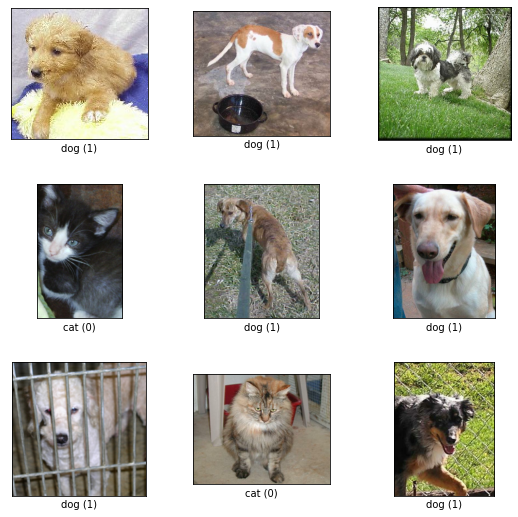

In [10]:
fig = tfds.show_examples(ds_train, ds_info)

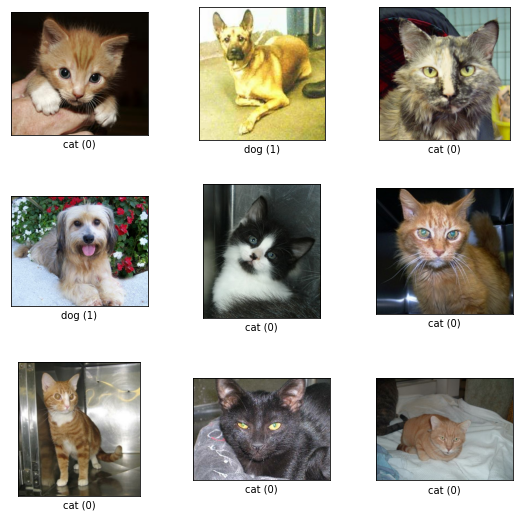

In [11]:
fig = tfds.show_examples(ds_test, ds_info)

In [12]:
def build_resnet_block(input_layer,stage_num=0,block_num=0,channel=64,is_down=False,is_50=False,is_plane=False,is_flag=False):
    # 입력 레이어
    x = input_layer
    initial=input_layer
    # CNN 레이어
  
    if is_down==True:  
        if is_50==False:
            x = keras.layers.Conv2D(filters=channel,kernel_size=(3,3),kernel_initializer='he_normal',padding='same',
                                    name=f'stage{stage_num}_{block_num}_conv{1}',strides=(2, 2))(x)
            x = keras.layers.BatchNormalization(name=f'stage{stage_num}_{block_num}_bn{1}')(x)
            x = keras.layers.Activation('relu')(x)
            
            
            initial=keras.layers.Conv2D(filters=channel,kernel_size=(1,1),kernel_initializer='he_normal',padding='same',
                                    name=f'stage{stage_num}_{block_num}_short',strides=(2, 2))(initial)
            initial = keras.layers.BatchNormalization(name=f'stage{stage_num}_{block_num}_bn{4}')(initial)        
        
        
        else:
            x = keras.layers.Conv2D(filters=channel,kernel_size=(1,1),kernel_initializer='he_normal',padding='same',
                                    name=f'stage{stage_num}_{block_num}_conv{1}',strides=(2, 2))(x)
            x = keras.layers.BatchNormalization(name=f'stage{stage_num}_{block_num}_bn{1}')(x)
            x = keras.layers.Activation('relu')(x)                        
            
            initial=keras.layers.Conv2D(filters=channel*4,kernel_size=(1,1),kernel_initializer='he_normal',padding='same',
                                        name=f'stage{stage_num}_{block_num}_short',strides=(2, 2))(initial)
            initial = keras.layers.BatchNormalization(name=f'stage{stage_num}_{block_num}_bn{4}')(initial) 
        
 
    else:
        if is_50==False:
            x = keras.layers.Conv2D(filters=channel,kernel_size=(3,3),kernel_initializer='he_normal',padding='same',
                                    name=f'stage{stage_num}_{block_num}_conv{1}',strides=(1, 1))(x)
        else:
            x = keras.layers.Conv2D(filters=channel,kernel_size=(1,1),kernel_initializer='he_normal',padding='same',
                                    name=f'stage{stage_num}_{block_num}_conv{1}',strides=(1, 1))(x)

            
            if is_flag==True:                    
                initial= keras.layers.Conv2D(filters=channel*4,kernel_size=(1,1),kernel_initializer='he_normal',padding='same',
                                    name=f'stage{stage_num}_{block_num}_short2',strides=(1, 1))(initial)
                initial = keras.layers.BatchNormalization(name=f'stage{stage_num}_{block_num}_bn{5}')(initial) 
                        
            
        x = keras.layers.BatchNormalization(name=f'stage{stage_num}_{block_num}_bn{1}')(x) 
        x = keras.layers.Activation('relu')(x)
        
        
        
        
    if is_50==False:     
        x = keras.layers.Conv2D(filters=channel,kernel_size=(3,3),kernel_initializer='he_normal',padding='same',
                                name=f'stage{stage_num}_{block_num}_conv{2}')(x)
        x = keras.layers.BatchNormalization(name=f'stage{stage_num}_{block_num}_bn{2}')(x)
    
    else:
        x = keras.layers.Conv2D(filters=channel,kernel_size=(3,3),kernel_initializer='he_normal',padding='same',
                                name=f'stage{stage_num}_{block_num}_conv{2}')(x)
        x = keras.layers.BatchNormalization(name=f'stage{stage_num}_{block_num}_bn{2}')(x)        
        x = keras.layers.Activation('relu')(x)
        x = keras.layers.Conv2D(filters=channel*4,kernel_size=(1,1),kernel_initializer='he_normal',padding='same',
                                name=f'stage{stage_num}_{block_num}_conv{3}')(x)
        x = keras.layers.BatchNormalization(name=f'stage{stage_num}_{block_num}_bn{3}')(x)        
  
    
    
    # skip connection
    if is_plane==False:   
          
        x = keras.layers.Add(name=f'stage{stage_num}_{block_num}_add')([x, initial])
    
    x = keras.layers.Activation('relu')(x)
    
    return x

In [13]:
resnet_input_layer = keras.layers.Input(shape=(8,8,64),)   # 입력 레이어 생성
resnet_block_output = build_resnet_block(resnet_input_layer,is_50=True,is_down=False,is_flag=True)    # VGG 블록 생성

In [14]:
model = keras.Model(inputs=resnet_input_layer, outputs=resnet_block_output)  

model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 8, 8, 64)]   0                                            
__________________________________________________________________________________________________
stage0_0_conv1 (Conv2D)         (None, 8, 8, 64)     4160        input_1[0][0]                    
__________________________________________________________________________________________________
stage0_0_bn1 (BatchNormalizatio (None, 8, 8, 64)     256         stage0_0_conv1[0][0]             
__________________________________________________________________________________________________
activation (Activation)         (None, 8, 8, 64)     0           stage0_0_bn1[0][0]               
______________________________________________________________________________________________

In [33]:
def build_resnet(input_shape=(32,32,3),is_50=False, is_plane=False,is_flag=False):
    
    #assert len(num_cnn_list) == len(channel_list) #모델을 만들기 전에 config list들이 같은 길이인지 확인합니다.
    
    input_layer = keras.layers.Input(shape=input_shape)  # input layer를 만들어둡니다.
    output = input_layer
    stage_num=0
    block_num=0
    
    
    
    # stage1
    output = keras.layers.Conv2D(filters=64,kernel_size=(7,7),kernel_initializer='he_normal',padding='same',strides=(2, 2))(output)
    output = keras.layers.BatchNormalization()(output)
    output = keras.layers.Activation('relu')(output)
    
    #stage2
    
    output = keras.layers.MaxPooling2D(pool_size=(2, 2),strides=2,name=f'stage{2}_{0}_maxpooling')(output)
    output = build_resnet_block(output,stage_num=2,block_num=1,channel=64,is_50=is_50,is_plane=is_plane,is_flag=True)
    output = build_resnet_block(output,stage_num=2,block_num=2,channel=64,is_50=is_50,is_plane=is_plane) 
    output = build_resnet_block(output,stage_num=2,block_num=3,channel=64,is_50=is_50,is_plane=is_plane)     
        
        
   #stage3
   
    output = build_resnet_block(output,stage_num=3,block_num=1,channel=128,is_down=True,is_50=is_50,is_plane=is_plane)
    output = build_resnet_block(output,stage_num=3,block_num=2,channel=128,is_50=is_50,is_plane=is_plane) 
    output = build_resnet_block(output,stage_num=3,block_num=3,channel=128,is_50=is_50,is_plane=is_plane)        
    output = build_resnet_block(output,stage_num=3,block_num=4,channel=128,is_50=is_50,is_plane=is_plane)    
        
    #stage4
    
    output = build_resnet_block(output,stage_num=4,block_num=1,channel=256,is_down=True,is_50=is_50,is_plane=is_plane)
    output = build_resnet_block(output,stage_num=4,block_num=2,channel=256,is_50=is_50,is_plane=is_plane) 
    output = build_resnet_block(output,stage_num=4,block_num=3,channel=256,is_50=is_50,is_plane=is_plane)        
    output = build_resnet_block(output,stage_num=4,block_num=4,channel=256,is_50=is_50,is_plane=is_plane)            
    output = build_resnet_block(output,stage_num=4,block_num=5,channel=256,is_50=is_50,is_plane=is_plane) 
    output = build_resnet_block(output,stage_num=4,block_num=6,channel=256,is_50=is_50,is_plane=is_plane) 
        
        
        
    #stage5
    
    output = build_resnet_block(output,stage_num=5,block_num=1,channel=512,is_down=True,is_50=is_50,is_plane=is_plane)
    output = build_resnet_block(output,stage_num=5,block_num=2,channel=512,is_50=is_50,is_plane=is_plane) 
    output = build_resnet_block(output,stage_num=5,block_num=3,channel=512,is_50=is_50,is_plane=is_plane)        
        
        
        
        
        
   
    output=tf.keras.layers.AveragePooling2D(pool_size=(1, 1))(output)
    output = keras.layers.Flatten(name='flatten')(output)
    output = keras.layers.Dense(1, activation='sigmoid', name='fc1000')(output)
    
    
    
    
    model = keras.Model(
        inputs=input_layer, 
        outputs=output
    )
    return model

In [16]:
resnet_34 = build_resnet(input_shape=(32, 32,3), is_50=False, is_plane=False)
resnet_34.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 16, 16, 64)   9472        input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 16, 16, 64)   256         conv2d[0][0]                     
__________________________________________________________________________________________________
activation_3 (Activation)       (None, 16, 16, 64)   0           batch_normalization[0][0]        
____________________________________________________________________________________________

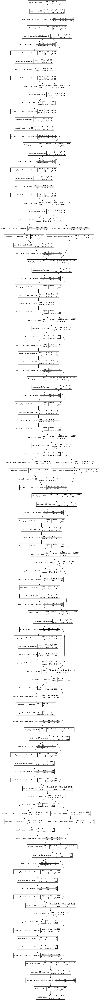

In [17]:
tf.keras.utils.plot_model(resnet_34, to_file='./resnet_34.png', show_shapes=True)

In [18]:
resnet_50 = build_resnet(input_shape=(32, 32,3),is_50=True,is_flag=True)
resnet_50.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 16, 16, 64)   9472        input_3[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 16, 16, 64)   256         conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_36 (Activation)      (None, 16, 16, 64)   0           batch_normalization_1[0][0]      
____________________________________________________________________________________________

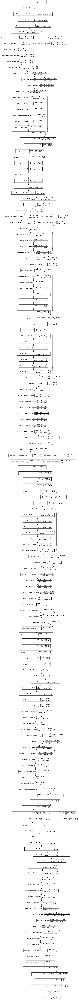

In [19]:
tf.keras.utils.plot_model(resnet_50, to_file='./resnet_50.png', show_shapes=True)

In [20]:
BATCH_SIZE = 16
EPOCH = 10

In [21]:
ds_train = apply_normalize_on_dataset(ds_train, batch_size=BATCH_SIZE)
ds_test = apply_normalize_on_dataset(ds_test, batch_size=BATCH_SIZE)

In [22]:
resnet_34 = build_resnet(input_shape=(224, 224,3), is_50=True)
resnet_34.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 112, 112, 64) 9472        input_4[0][0]                    
__________________________________________________________________________________________________
batch_normalization_2 (BatchNor (None, 112, 112, 64) 256         conv2d_2[0][0]                   
__________________________________________________________________________________________________
activation_85 (Activation)      (None, 112, 112, 64) 0           batch_normalization_2[0][0]      
____________________________________________________________________________________________

In [23]:
resnet_34.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.SGD(lr=0.01, clipnorm=1.),
    metrics=['accuracy'],
)

history_34 = resnet_34.fit(
    ds_train,
    steps_per_epoch=int(ds_info.splits['train[:80%]'].num_examples/BATCH_SIZE),
    validation_steps=int(ds_info.splits['train[80%:]'].num_examples/BATCH_SIZE),
    epochs=EPOCH,
    validation_data=ds_test,
    verbose=1,
    use_multiprocessing=True,
)

Epoch 1/10
1163/1163 [==============================] - 562s 445ms/step - loss: 1.0661 - accuracy: 0.5322 - val_loss: 0.9651 - val_accuracy: 0.5418
Epoch 2/10
1163/1163 [==============================] - 536s 461ms/step - loss: 1.0013 - accuracy: 0.5492 - val_loss: 1.1813 - val_accuracy: 0.5537
Epoch 3/10
1163/1163 [==============================] - 504s 433ms/step - loss: 0.9638 - accuracy: 0.5691 - val_loss: 1.3546 - val_accuracy: 0.5394
Epoch 4/10
1163/1163 [==============================] - 504s 433ms/step - loss: 0.9098 - accuracy: 0.5906 - val_loss: 1.1915 - val_accuracy: 0.5736
Epoch 5/10
1163/1163 [==============================] - 504s 433ms/step - loss: 0.8617 - accuracy: 0.6190 - val_loss: 1.5121 - val_accuracy: 0.5360
Epoch 6/10
1163/1163 [==============================] - 503s 433ms/step - loss: 0.8560 - accuracy: 0.6268 - val_loss: 1.1125 - val_accuracy: 0.6292
Epoch 7/10
1163/1163 [==============================] - 503s 433ms/step - loss: 0.8254 - accuracy: 0.6422 - val_

In [24]:
resnet_50 = build_resnet(input_shape=(224, 224,3), is_50=True, is_plane=False)
resnet_50.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_3 (Conv2D)               (None, 112, 112, 64) 9472        input_5[0][0]                    
__________________________________________________________________________________________________
batch_normalization_3 (BatchNor (None, 112, 112, 64) 256         conv2d_3[0][0]                   
__________________________________________________________________________________________________
activation_134 (Activation)     (None, 112, 112, 64) 0           batch_normalization_3[0][0]      
____________________________________________________________________________________________

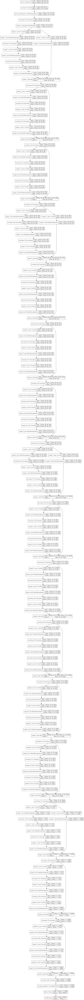

In [25]:
tf.keras.utils.plot_model(resnet_50, to_file='./plane_50.png', show_shapes=True)

In [26]:
resnet_50.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.SGD(lr=0.1, clipnorm=1.),
    metrics=['accuracy'],
)

history_50 = resnet_50.fit(
    ds_train,
    steps_per_epoch=int(ds_info.splits['train[:80%]'].num_examples/BATCH_SIZE),
    validation_steps=int(ds_info.splits['train[80%:]'].num_examples/BATCH_SIZE),
    epochs=EPOCH,
    validation_data=ds_test,
    verbose=1,
    use_multiprocessing=True,
)

Epoch 1/10
1163/1163 [==============================] - 517s 433ms/step - loss: 3.8215 - accuracy: 0.5045 - val_loss: 8.3058 - val_accuracy: 0.5884
Epoch 2/10
1163/1163 [==============================] - 502s 432ms/step - loss: 1.5130 - accuracy: 0.5991 - val_loss: 0.9213 - val_accuracy: 0.6170
Epoch 3/10
1163/1163 [==============================] - 502s 431ms/step - loss: 1.1036 - accuracy: 0.6579 - val_loss: 32.2236 - val_accuracy: 0.6018
Epoch 4/10
1163/1163 [==============================] - 502s 432ms/step - loss: 0.8050 - accuracy: 0.6919 - val_loss: 0.9748 - val_accuracy: 0.6511
Epoch 5/10
1163/1163 [==============================] - 502s 432ms/step - loss: 0.5441 - accuracy: 0.7362 - val_loss: 0.5874 - val_accuracy: 0.7478
Epoch 6/10
1163/1163 [==============================] - 502s 432ms/step - loss: 0.4740 - accuracy: 0.7731 - val_loss: 0.6744 - val_accuracy: 0.7647
Epoch 7/10
1163/1163 [==============================] - 502s 432ms/step - loss: 0.4308 - accuracy: 0.7971 - val

In [34]:
plane_34 = build_resnet(input_shape=(224, 224,3), is_50=False, is_plane=True)
plane_34.summary()

Model: "model_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 112, 112, 64)      9472      
_________________________________________________________________
batch_normalization_6 (Batch (None, 112, 112, 64)      256       
_________________________________________________________________
activation_249 (Activation)  (None, 112, 112, 64)      0         
_________________________________________________________________
stage2_0_maxpooling (MaxPool (None, 56, 56, 64)        0         
_________________________________________________________________
stage2_1_conv1 (Conv2D)      (None, 56, 56, 64)        36928     
_________________________________________________________________
stage2_1_bn1 (BatchNormaliza (None, 56, 56, 64)        256 

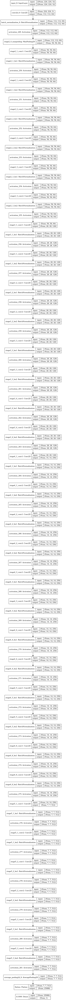

In [35]:
tf.keras.utils.plot_model(plane_34, to_file='./plane_34.png', show_shapes=True)

In [36]:
plane_34.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.SGD(lr=0.01, clipnorm=1.),
    metrics=['accuracy'],
)

history_p34 = plane_34.fit(
    ds_train,
    steps_per_epoch=int(ds_info.splits['train[:80%]'].num_examples/BATCH_SIZE),
    validation_steps=int(ds_info.splits['train[80%:]'].num_examples/BATCH_SIZE),
    epochs=EPOCH,
    validation_data=ds_test,
    verbose=1,
    use_multiprocessing=True,
)

Epoch 1/10
1163/1163 [==============================] - 299s 249ms/step - loss: 0.7646 - accuracy: 0.5285 - val_loss: 0.9256 - val_accuracy: 0.5110
Epoch 2/10
1163/1163 [==============================] - 288s 248ms/step - loss: 0.7567 - accuracy: 0.5392 - val_loss: 0.7842 - val_accuracy: 0.5352
Epoch 3/10
1163/1163 [==============================] - 288s 248ms/step - loss: 0.7515 - accuracy: 0.5491 - val_loss: 1.1677 - val_accuracy: 0.5416
Epoch 4/10
1163/1163 [==============================] - 288s 248ms/step - loss: 0.7445 - accuracy: 0.5394 - val_loss: 0.8323 - val_accuracy: 0.5386
Epoch 5/10
1163/1163 [==============================] - 288s 248ms/step - loss: 0.7261 - accuracy: 0.5560 - val_loss: 0.7197 - val_accuracy: 0.5470
Epoch 6/10
1163/1163 [==============================] - 288s 248ms/step - loss: 0.6868 - accuracy: 0.5974 - val_loss: 0.7428 - val_accuracy: 0.6352
Epoch 7/10
1163/1163 [==============================] - 288s 248ms/step - loss: 0.6719 - accuracy: 0.6350 - val_

In [37]:
plane_50 = build_resnet(input_shape=(224, 224,3), is_50=True, is_plane=True)
plane_50.summary()

Model: "model_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_9 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 112, 112, 64)      9472      
_________________________________________________________________
batch_normalization_7 (Batch (None, 112, 112, 64)      256       
_________________________________________________________________
activation_282 (Activation)  (None, 112, 112, 64)      0         
_________________________________________________________________
stage2_0_maxpooling (MaxPool (None, 56, 56, 64)        0         
_________________________________________________________________
stage2_1_conv1 (Conv2D)      (None, 56, 56, 64)        4160      
_________________________________________________________________
stage2_1_bn1 (BatchNormaliza (None, 56, 56, 64)        256 

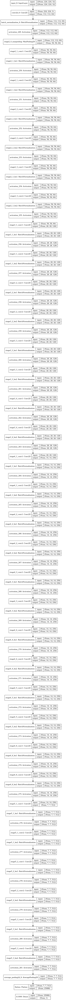

In [38]:
tf.keras.utils.plot_model(plane_34, to_file='./plane_50.png', show_shapes=True)

In [39]:
plane_50.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.SGD(lr=0.01, clipnorm=1.),
    metrics=['accuracy'],
)

history_p50 = plane_50.fit(
    ds_train,
    steps_per_epoch=int(ds_info.splits['train[:80%]'].num_examples/BATCH_SIZE),
    validation_steps=int(ds_info.splits['train[80%:]'].num_examples/BATCH_SIZE),
    epochs=EPOCH,
    validation_data=ds_test,
    verbose=1,
    use_multiprocessing=True,
)

Epoch 1/10
1163/1163 [==============================] - 446s 372ms/step - loss: 0.7957 - accuracy: 0.5230 - val_loss: 0.8811 - val_accuracy: 0.5220
Epoch 2/10
1163/1163 [==============================] - 432s 372ms/step - loss: 0.8033 - accuracy: 0.5193 - val_loss: 0.9203 - val_accuracy: 0.5101
Epoch 3/10
1163/1163 [==============================] - 432s 372ms/step - loss: 0.8119 - accuracy: 0.5194 - val_loss: 2.1764 - val_accuracy: 0.4907
Epoch 4/10
1163/1163 [==============================] - 432s 372ms/step - loss: 0.8270 - accuracy: 0.5085 - val_loss: 1.0162 - val_accuracy: 0.5011
Epoch 5/10
1163/1163 [==============================] - 432s 372ms/step - loss: 0.8124 - accuracy: 0.5073 - val_loss: 1.0663 - val_accuracy: 0.5065
Epoch 6/10
1163/1163 [==============================] - 433s 372ms/step - loss: 0.8314 - accuracy: 0.5010 - val_loss: 1.0787 - val_accuracy: 0.5132
Epoch 7/10
1163/1163 [==============================] - 432s 372ms/step - loss: 0.8197 - accuracy: 0.5067 - val_

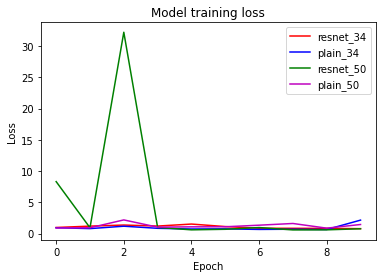

In [53]:
import matplotlib.pyplot as plt

plt.plot(history_34.history['val_loss'], 'r')
plt.plot(history_p34.history['val_loss'], 'b')
plt.plot(history_50.history['val_loss'], 'g')
plt.plot(history_p50.history['val_loss'], 'm')
plt.title('Model training loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['resnet_34', 'plain_34','resnet_50','plain_50'], loc='best')
plt.show()

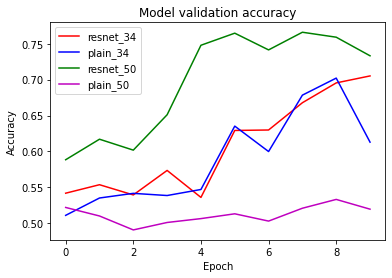

In [52]:
import matplotlib.pyplot as plt

plt.plot(history_34.history['val_accuracy'], 'r')
plt.plot(history_p34.history['val_accuracy'], 'b')
plt.plot(history_50.history['val_accuracy'], 'g')
plt.plot(history_p50.history['val_accuracy'], 'm')
plt.title('Model validation accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['resnet_34', 'plain_34','resnet_50','plain_50'], loc='upper left')
plt.show()

## 회고
* 최종 결과 validation loss가 resnet 34, resnet 50, plain 34, plain 50 전부  0에 가깝게 줄어들었습니다.
* validation accuracy는 resnet 50이 가장 좋은 그래프를그렸으며 resnet 34와 plain_34 가 비슷하나 마지막에는 resnet 34가 결과가 좋았습니다. 가장안좋은 결과를 갖는 모델은 plain 50이었습니다.
* plain 50은 resnet 논문의 내용에 따라 깊은 모델이 깊게되면 degradation이 발생하여 결과가 안좋은 것으로 보입니다.
